Using device: cuda


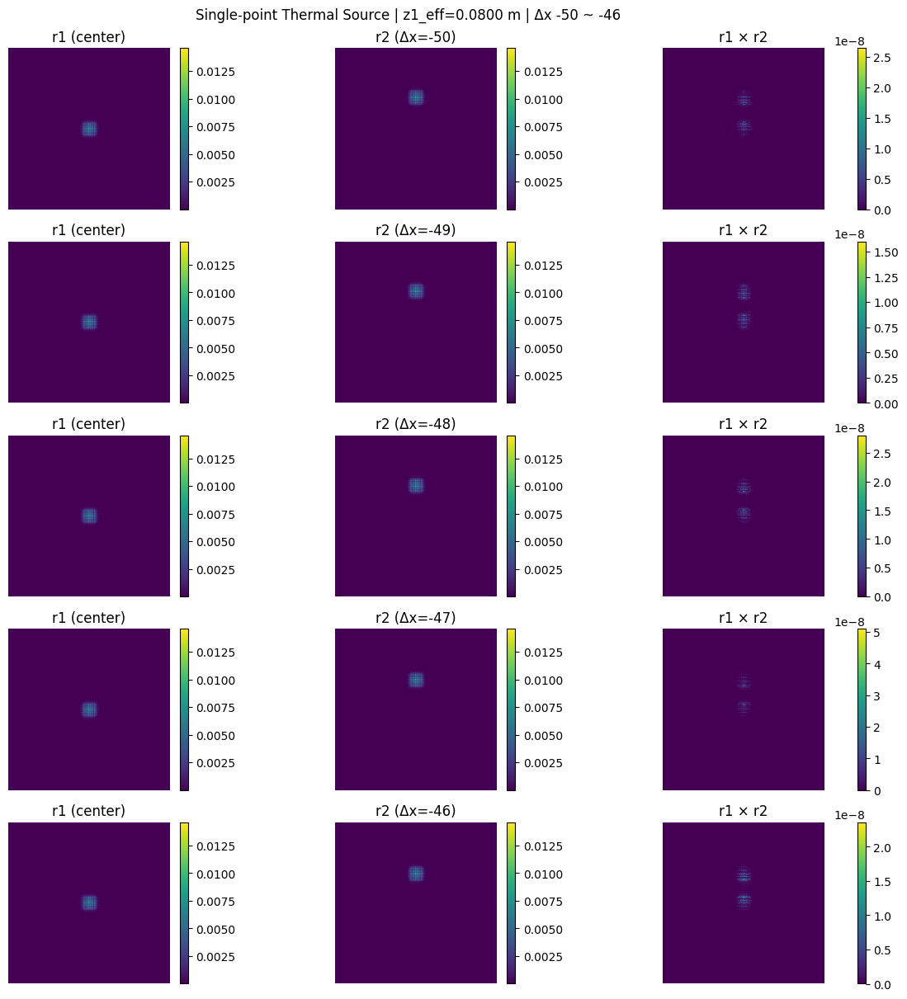

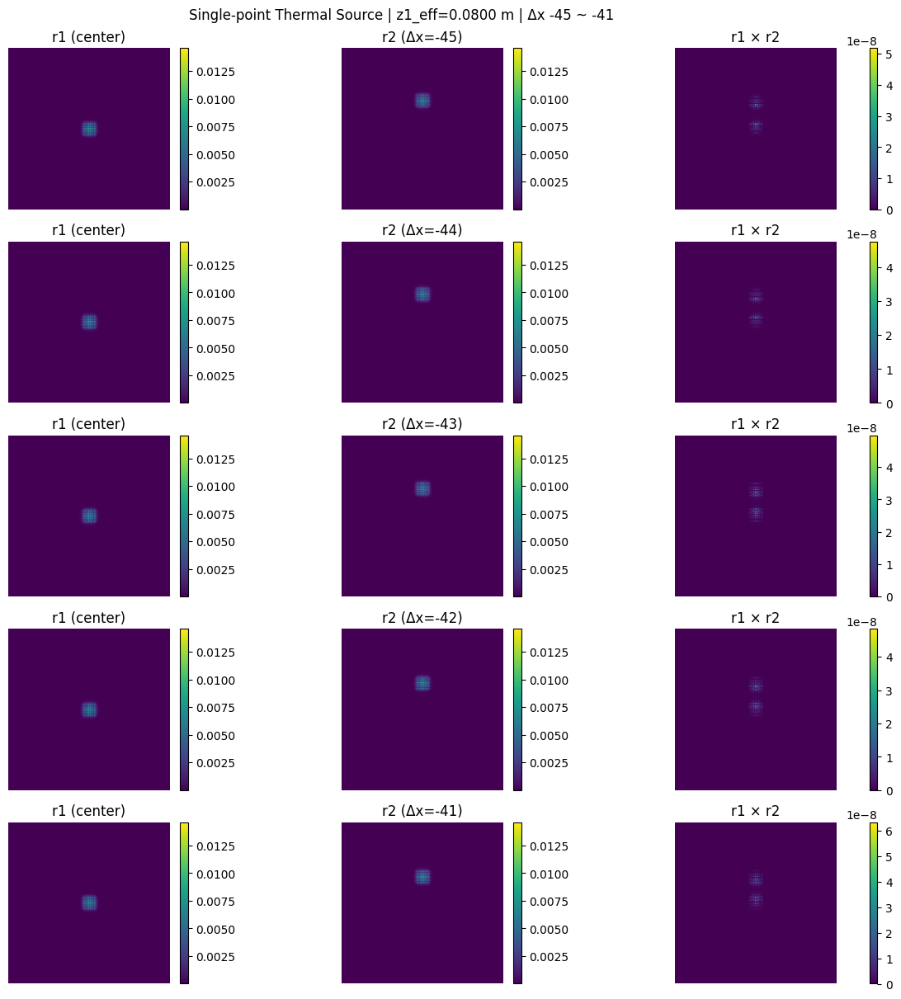

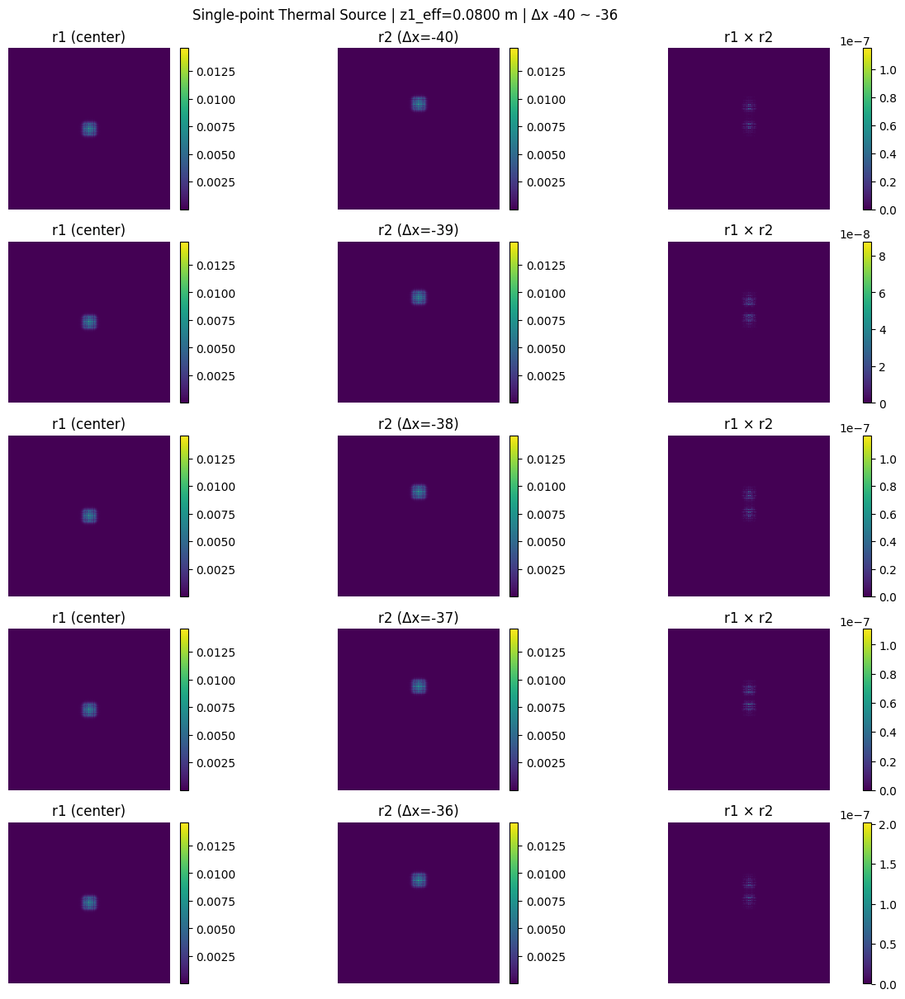

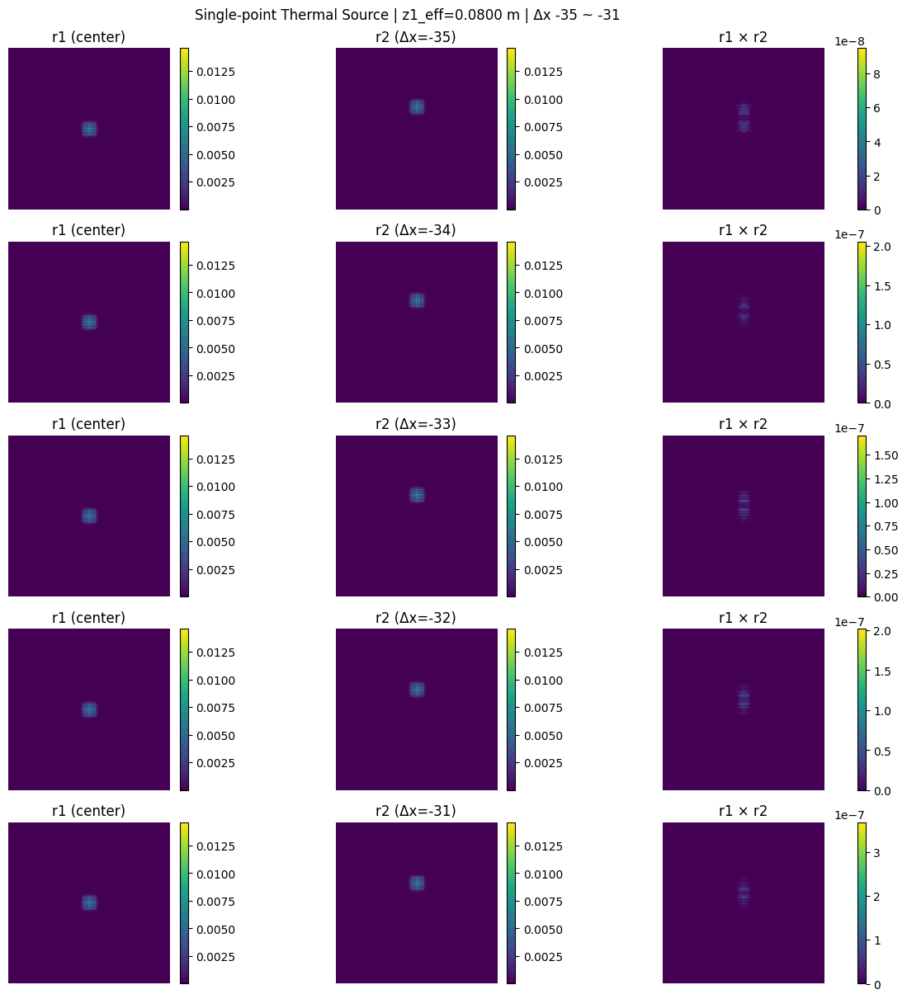

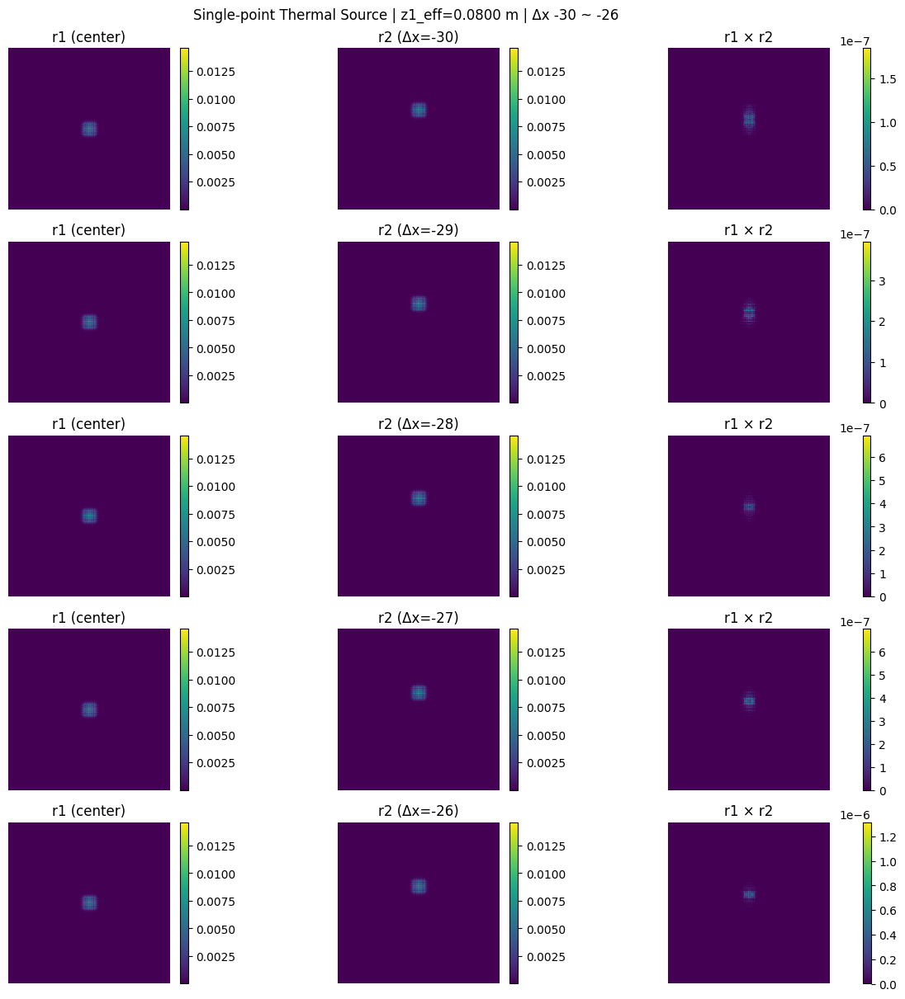

...

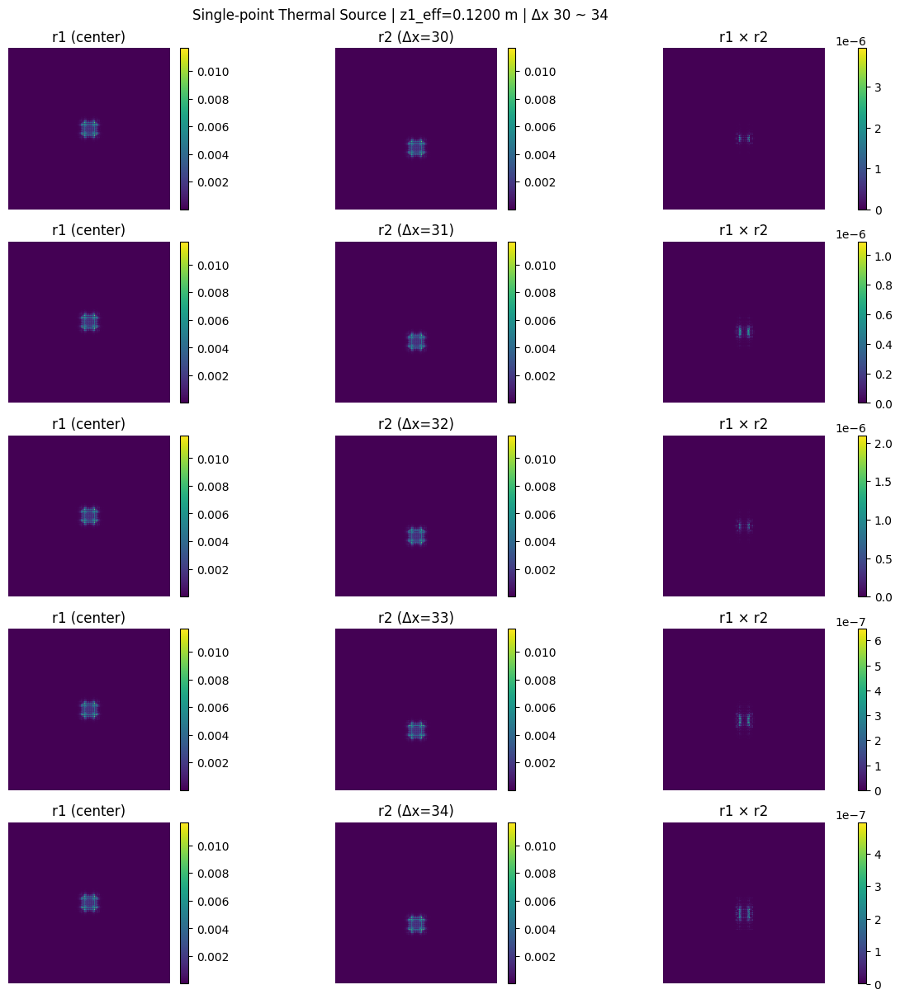

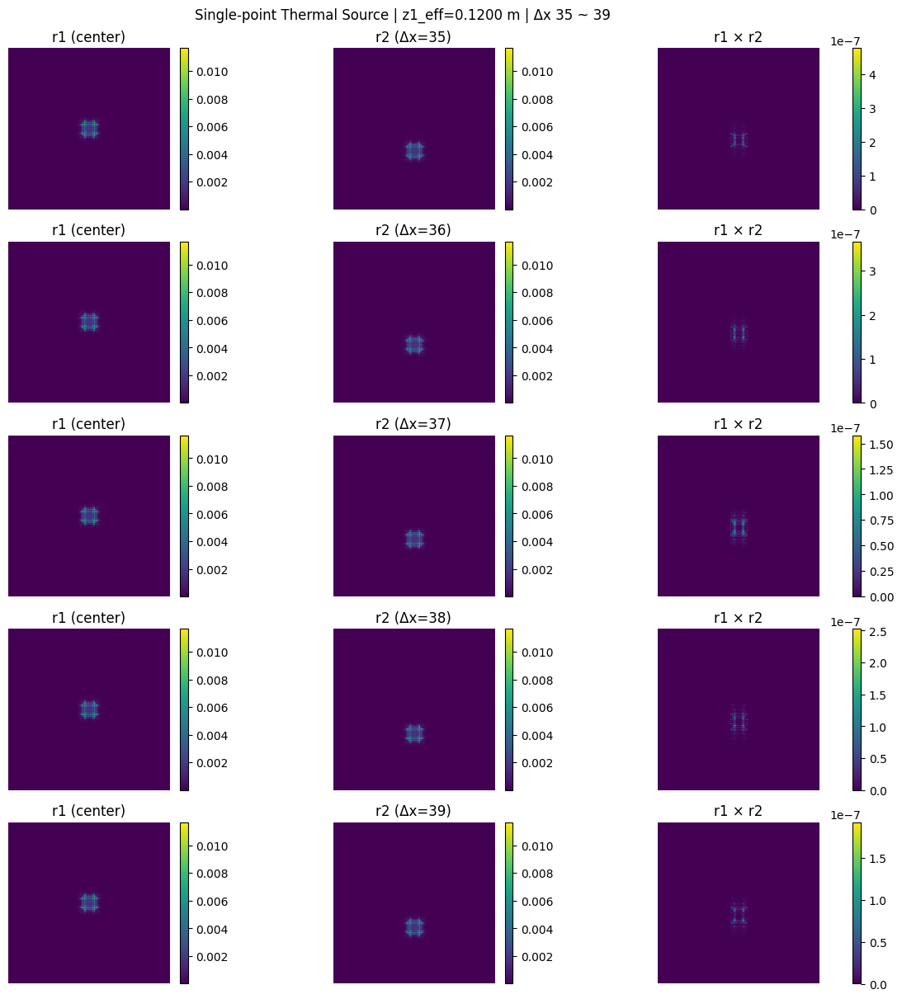

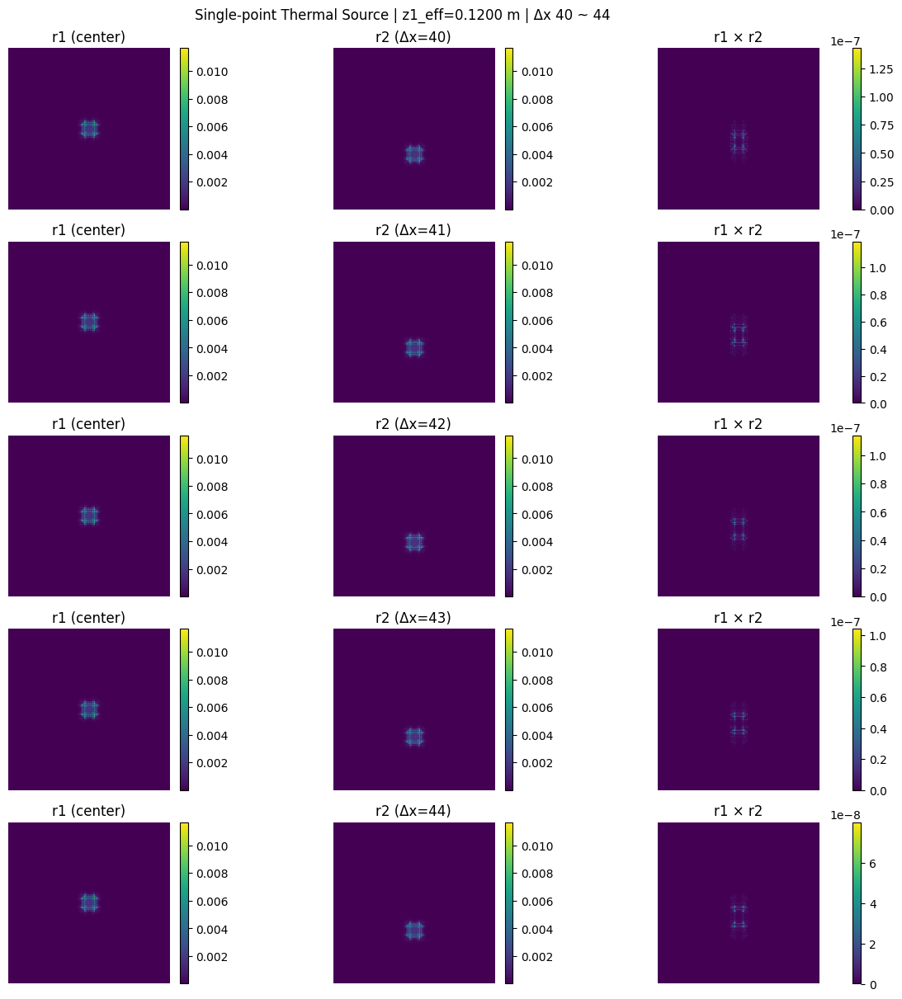

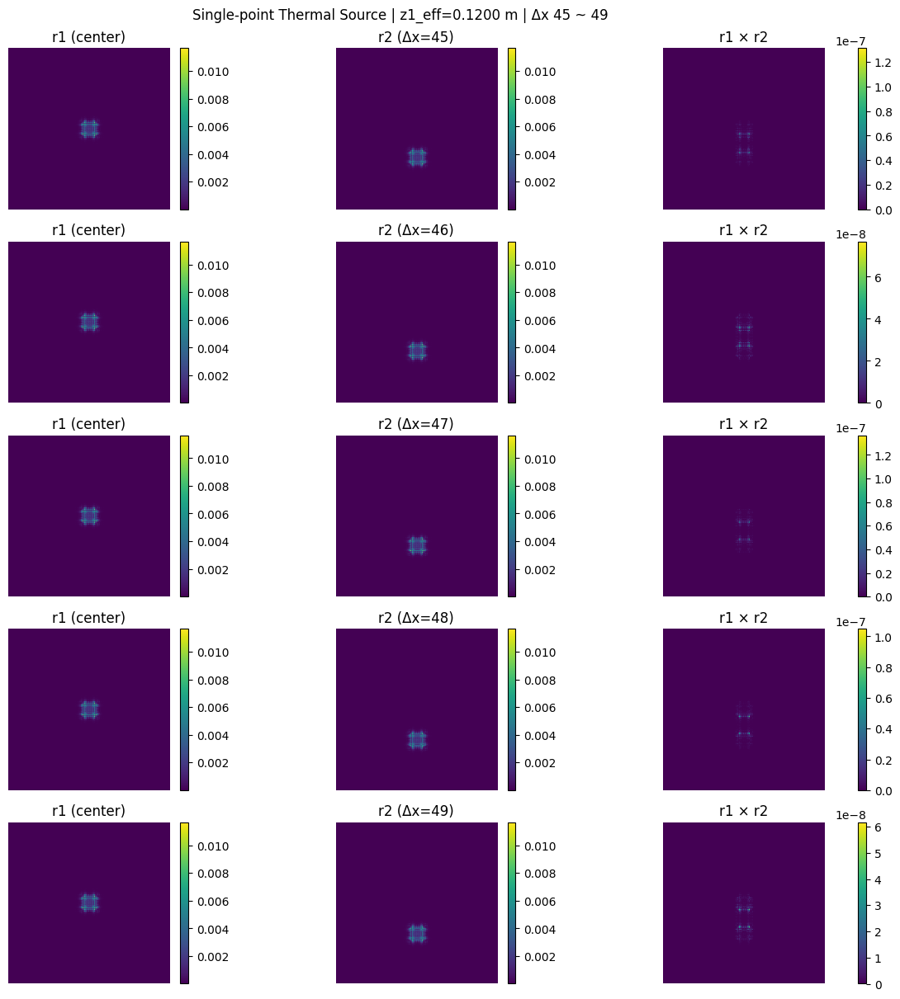

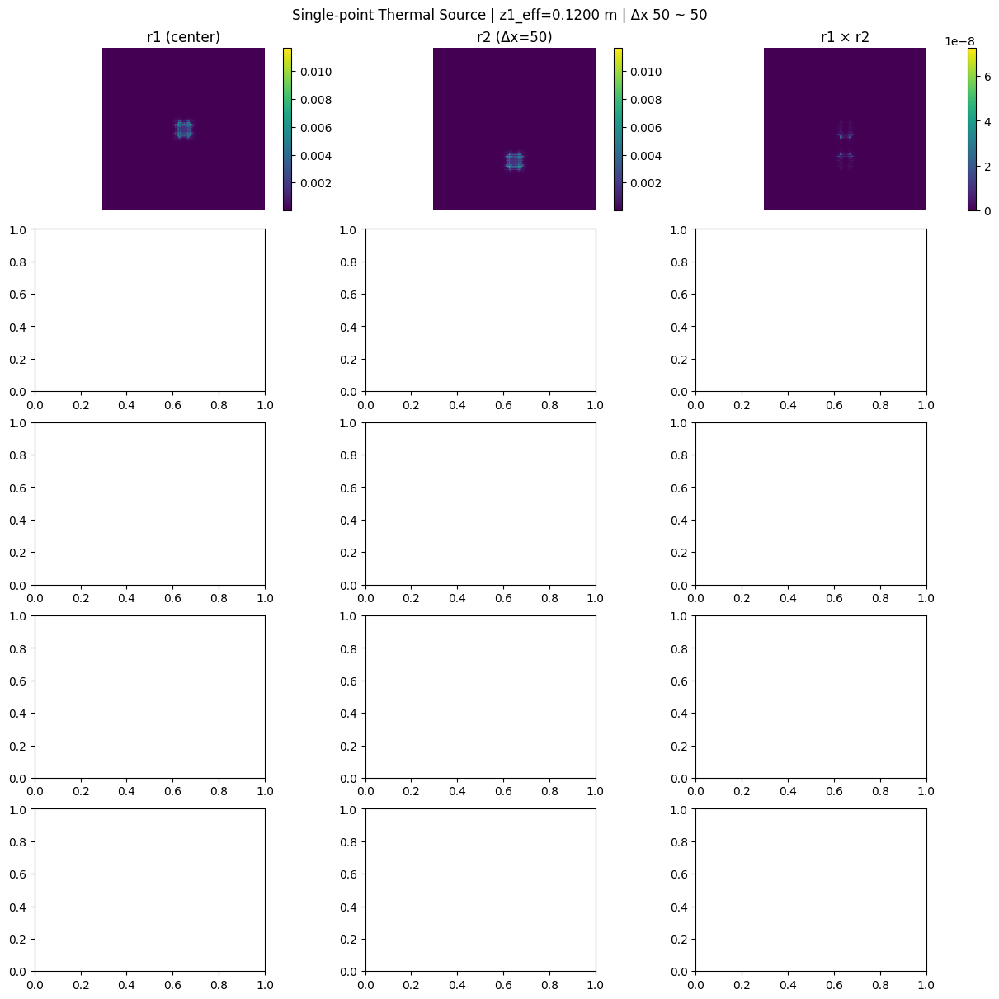

Thermal source simulation completed.


In [1]:
import torch
import matplotlib.pyplot as plt
from torchOptics.optics import Tensor, propASM, applylens
import numpy as np

# === [Experiment Conditions] ===
wavelength = 632.8e-9  # m (e.g., HeNe laser)
grid_size = 256
dx = 50e-6  # m
f_plus = 0.15
f_minus = 0.25
meta = {'dx': (dx, dx), 'wl': (wavelength,)}

# === [GPU Settings] ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define source sample point (Thermal)
center_point = grid_size // 2
source_point = [(center_point, center_point)]

z1_min = 0.08
z1_max = 0.12
num_z1_steps = 5
z1_values_to_simulate = torch.linspace(z1_min, z1_max, num_z1_steps)

z2_fixed = 0.05

# Create coordinates for lens phase - move to GPU
x = torch.linspace(-grid_size//2, grid_size//2-1, grid_size) * dx
X, Y = torch.meshgrid(x, x, indexing='ij')
R2 = (X**2 + Y**2).to(device)

k = 2 * np.pi / wavelength

# Calculate lens phase terms
phase_term1 = torch.exp(1j * torch.tensor(k / (2 * f_plus), dtype=torch.complex64).to(device) * R2)
phase_term2 = torch.exp(1j * torch.tensor(k / (2 * f_minus), dtype=torch.complex64).to(device) * R2)
total_lens_phase_term = phase_term1 + phase_term2

# Loop over z1_eff values
for z1_eff in z1_values_to_simulate:
    # Initialize intensity map for incoherent sum
    total_intensity_at_detector = torch.zeros((grid_size, grid_size), dtype=torch.float32, device=device)

    # Source is always at the center
    center = grid_size // 2
    x1, y1 = center, center
    E0_template = torch.zeros((grid_size, grid_size), dtype=torch.complex64, device=device)
    E0_template[x1, y1] = 1.0 # Source field at the center
    E0 = Tensor(E0_template, meta)

    # Optical system propagation
    E1 = propASM(E0, float(z1_eff))
    E2 = E1 * total_lens_phase_term
    E3 = propASM(E2, float(z2_fixed))

    # Incoherent sum (intensity)
    intensity_from_point = torch.abs(E3)**2
    total_intensity_at_detector += intensity_from_point.squeeze(0)

    # For all Δx from -50 to 50, show r1, r2, r1*r2 maps (5 per figure)
    delta_pixel_list = list(range(-50, 51))
    intensity_map_r1 = total_intensity_at_detector.cpu().numpy()
    for i in range(0, len(delta_pixel_list), 5):
        fig, axes = plt.subplots(5, 3, figsize=(12, 12), constrained_layout=True)
        for j, delta_pixel in enumerate(delta_pixel_list[i:i+5]):
            # r2: intensity map shifted by Δx
            intensity_map_r2 = torch.roll(total_intensity_at_detector, shifts=delta_pixel, dims=0).cpu().numpy()
            # r1 * r2: element-wise multiplication
            intensity_map_mul = intensity_map_r1 * intensity_map_r2
            # r1
            ax1 = axes[j, 0]
            im1 = ax1.imshow(intensity_map_r1, cmap='viridis')
            ax1.set_title(f"r1 (center)")
            ax1.axis('off')
            fig.colorbar(im1, ax=ax1, orientation='vertical', fraction=0.046, pad=0.04)
            # r2
            ax2 = axes[j, 1]
            im2 = ax2.imshow(intensity_map_r2, cmap='viridis')
            ax2.set_title(f"r2 (Δx={delta_pixel})")
            ax2.axis('off')
            fig.colorbar(im2, ax=ax2, orientation='vertical', fraction=0.046, pad=0.04)
            # r1*r2
            ax3 = axes[j, 2]
            im3 = ax3.imshow(intensity_map_mul, cmap='viridis')
            ax3.set_title(f"r1 × r2")
            ax3.axis('off')
            fig.colorbar(im3, ax=ax3, orientation='vertical', fraction=0.046, pad=0.04)
        plt.suptitle(f"Single-point Thermal Source | z1_eff={z1_eff:.4f} m | Δx {delta_pixel_list[i]} ~ {delta_pixel_list[min(i+4, len(delta_pixel_list)-1)]}")
        plt.show()

print("Thermal source simulation completed.")